<a target="_blank" href="https://colab.research.google.com/github/porteratzo/foundation_tutorial/blob/main/triceratops.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

In [ ]:
!git clone https://github.com/porteratzo/foundation_tutorial
!cp -r foundation_tutorial/* ./
!pip install gdown
!gdown --folder https://drive.google.com/drive/folders/12drHaqGJ7KMIlK5XXRx0PTQ0LKdewuos

# Triceratops — Segmentación por similitud (tutorial para estudiantes)

En este cuaderno veremos cómo extraer características densas con un modelo DINOv3, calcular similitudes entre parches, visualizar mapas de calor y entrenar un regresor lineal simple para segmentación basada en parches similares.

Objetivos:
- Entender extracción de características densas con un ViT preentrenado.
- Visualizar mapas de similitud y evaluar segmentaciones simples.
- Entrenar un clasificador lineal sobre parches para segmentación.

In [44]:
# Imports y constantes
from glob import glob

import cv2
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from PIL import Image
from torch import Tensor, nn
from tqdm import tqdm
from transformers import AutoModel, DINOv3ViTModel

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)
PATCH_SIZE = 16
IMAGE_SIZE = 960

print('Preparado: imports y constantes')

Preparado: imports y constantes


In [ ]:
# Definición de funciones auxiliares (transformación, extracción, similitud y visualización)
def resize_transform(mask_image: Image) -> torch.Tensor:
    return TF.to_tensor(TF.resize(mask_image, (IMAGE_SIZE, IMAGE_SIZE)))

Funciones definidas


In [46]:
# Cargar el modelo DINOv3 (puede requerir GPU e Internet para descargar pesos)
model: DINOv3ViTModel = AutoModel.from_pretrained((
    'dinov3-vitb16-pretrain-lvd1689m_offline'
    ),)
model.cuda()
print('Modelo cargado en GPU')

Modelo cargado en GPU


## Ejemplo 1 — Imagen `tricera/frutas.jpg`
Se selecciona un parche de interés y se visualiza el mapa de similitud y la segmentación resultante.

(np.float64(-0.5), np.float64(959.5), np.float64(959.5), np.float64(-0.5))

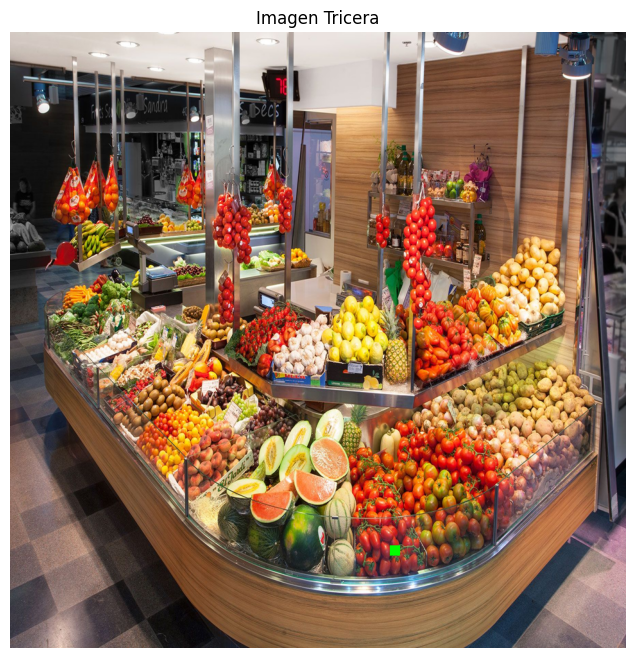

In [ ]:
# Ejemplo con tricera/frutas.jpg
frame = Image.open('tricera/frutas.jpg').convert('RGB').resize((IMAGE_SIZE, IMAGE_SIZE))

def extract_dense_features(image, normalize: bool = True) -> Tensor:
    """Extrae características densas desde el modelo DINOv3.
    Devuelve un tensor [C, H, W] en CPU.
    """
    with torch.inference_mode():
        with torch.autocast(device_type="cuda", dtype=torch.float32):
            image = image.convert("RGB")
            image_resized = resize_transform(image)
            image_resized = TF.normalize(image_resized, mean=IMAGENET_MEAN, std=IMAGENET_STD)
            image_resized = image_resized.unsqueeze(0).cuda()
            outputs = model(image_resized, output_hidden_states=True)
            feats = outputs.last_hidden_state[:, 1 + model.config.num_register_tokens :, :]
            B, _, h, w = image_resized.shape
            feats = [
                out.reshape(B, h // model.config.patch_size, w // model.config.patch_size, -1)
                .permute(0, 3, 1, 2)
                .contiguous()
                for out in feats
            ]
            if normalize:
                feats = [F.normalize(f, p=2, dim=1) for f in feats]
            return feats[-1].squeeze().detach().cpu()
        
image_features = extract_dense_features(frame)

# Coordenadas del parche(es) de interés (en píxeles), umbral y color de superposición
if True:
    # Sandias
    x, y = [400, 400], [750, 800]
    threshold = 0.75
    color = (255, 0, 0)
else:
    # Tomates
    x, y = [600], [800]
    threshold = 0.85
    color = (0, 255, 0)

patch_size = PATCH_SIZE
x, y = [int(xi / patch_size) for xi in x], [int(yi / patch_size) for yi in y]
image_with_patch = frame.copy()
image_with_patch = np.array(image_with_patch)
patches_of_interest = []
for _x, _y in zip(x, y):
    start_x = _x * patch_size
    start_y = _y * patch_size
    image_with_patch[start_y : start_y + patch_size, start_x : start_x + patch_size, :] = np.array(color, dtype=np.uint8)
    patches_of_interest.append(image_features[:, _y, _x])
plt.figure(figsize=(8, 8))
plt.imshow(image_with_patch)
plt.title('Imagen Tricera')

/tmp/ipykernel_3521316/1928049528.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("jet")


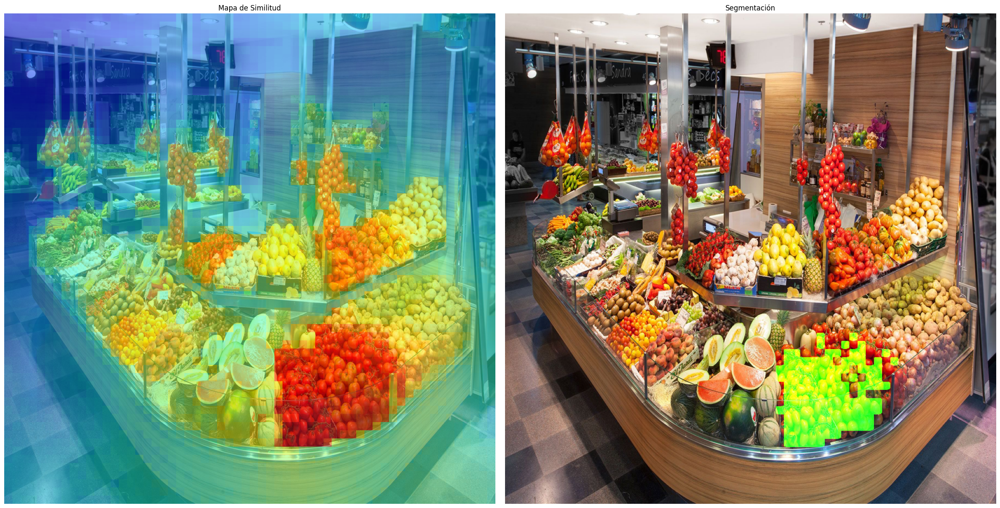

In [ ]:

patch_of_interest = torch.mean(torch.stack(patches_of_interest, dim=0), dim=0)
patch_of_interest = F.normalize(patch_of_interest, p=2, dim=0)

def compute_similarity(features_a: Tensor, features_b: Tensor) -> Tensor:
    """Calcula similitud por producto punto entre dos mapas de características.
    features_a: [H1, W1, D]
    features_b: [H2, W2, D]
    retorna tensor [H1, W1, H2, W2]
    """
    dot = torch.einsum("ijd, kld -> ijkl", features_a, features_b)
    return dot

def get_seg(frame, current_pred_np, color=(255, 0, 0)):
    """Aplica morfología y superpone una máscara coloreada sobre la imagen original."""
    segmented_frame = frame.copy()
    original_width, original_height = frame.size
    current_pred_np = Image.fromarray((current_pred_np).astype(np.uint8)).resize((original_width, original_height), resample=Image.NEAREST)
    current_pred_np = np.array(current_pred_np)

    import cv2
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
    opened = cv2.morphologyEx(current_pred_np, cv2.MORPH_OPEN, kernel)
    current_pred_np = opened

    segmented_frame = np.array(segmented_frame)
    overlay = current_pred_np[:, :, None] * np.array(color, dtype=np.uint8)
    segmented_frame = np.clip(segmented_frame.astype(np.int32) + overlay.astype(np.int32), 0, 255).astype(np.uint8)
    return segmented_frame

def jet_plot(frame, sims):
    """Crea un mapa de calor coloreado y lo mezcla con la imagen original."""
    colormap = cm.get_cmap("jet")
    original_width, original_height = frame.size
    colored_sims = colormap(sims.cpu().numpy())[:, :, :3]  # H, W, 3
    colored_sims = (colored_sims * 255).astype(np.uint8)
    colored_sims_pil = Image.fromarray(colored_sims).resize((original_width, original_height), resample=Image.NEAREST)
    blended = Image.blend(frame.convert("RGBA"), colored_sims_pil.convert("RGBA"), alpha=0.5)
    return blended

sims = compute_similarity(patch_of_interest.unsqueeze(0).unsqueeze(0), image_features.permute(1, 2, 0))
heat_image = jet_plot(frame, sims.squeeze(0).squeeze(0))
mask = (sims.squeeze(0).squeeze(0) > threshold).float().numpy()
segmented_frame = get_seg(frame, mask, color=color)

fig, axes = plt.subplots(1, 2, figsize=(24, 12))

axes[0].imshow(heat_image.resize((IMAGE_SIZE, IMAGE_SIZE)))
axes[0].set_axis_off()
axes[0].set_title('Mapa de Similitud')

axes[1].imshow(Image.fromarray(segmented_frame).resize((IMAGE_SIZE, IMAGE_SIZE)))
axes[1].set_axis_off()
axes[1].set_title('Segmentación')

fig.tight_layout()

## Ejemplo 2 — Imagen `tricera/frutas2.png`
Otro ejemplo con múltiples parches de interés.

(np.float64(-0.5), np.float64(959.5), np.float64(959.5), np.float64(-0.5))

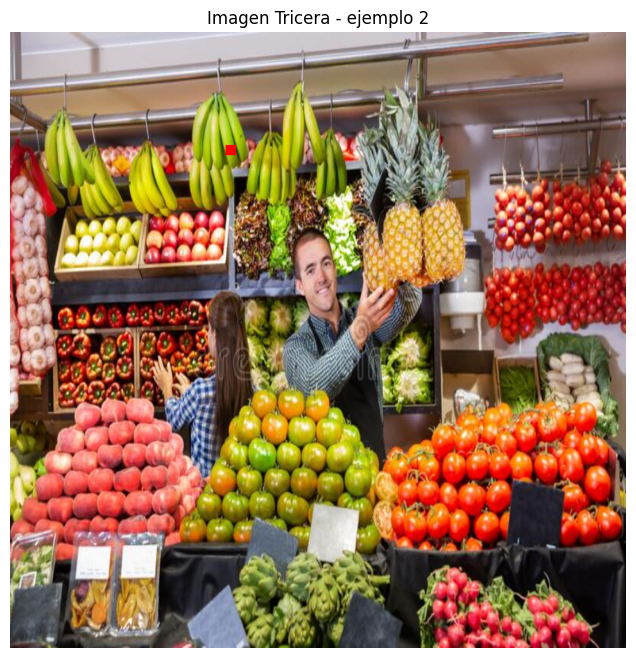

In [51]:
frame = Image.open('tricera/frutas2.png').convert('RGB').resize((IMAGE_SIZE, IMAGE_SIZE))
image_features = extract_dense_features(frame)

# Selección de parches (ejemplo)
if True:
    # Platano
    x, y = [350], [180]
    threshold = 0.7
    color = (255, 0, 0)
else:
    if True:
        # Cara hombre
        x, y = [480], [400]
        threshold = 0.75
    else:
        # Cara hombre y hombro mujer
        x, y = [480, 300], [380, 570]
        threshold = 0.7
    color = (0, 255, 0)

patch_size = PATCH_SIZE
x, y = [int(xi / patch_size) for xi in x], [int(yi / patch_size) for yi in y]
image_with_patch = frame.copy()
image_with_patch = np.array(image_with_patch)
patches_of_interest = []
for _x, _y in zip(x, y):
    start_x = _x * patch_size
    start_y = _y * patch_size
    image_with_patch[start_y : start_y + patch_size, start_x : start_x + patch_size, :] = np.array([255, 0, 0], dtype=np.uint8)
    patches_of_interest.append(image_features[:, _y, _x])

patch_of_interest = torch.mean(torch.stack(patches_of_interest, dim=0), dim=0)
patch_of_interest = F.normalize(patch_of_interest, p=2, dim=0)

plt.figure(figsize=(8, 8))
plt.imshow(image_with_patch)
plt.title('Imagen Tricera - ejemplo 2')
plt.axis('off')



/tmp/ipykernel_3521316/1928049528.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("jet")


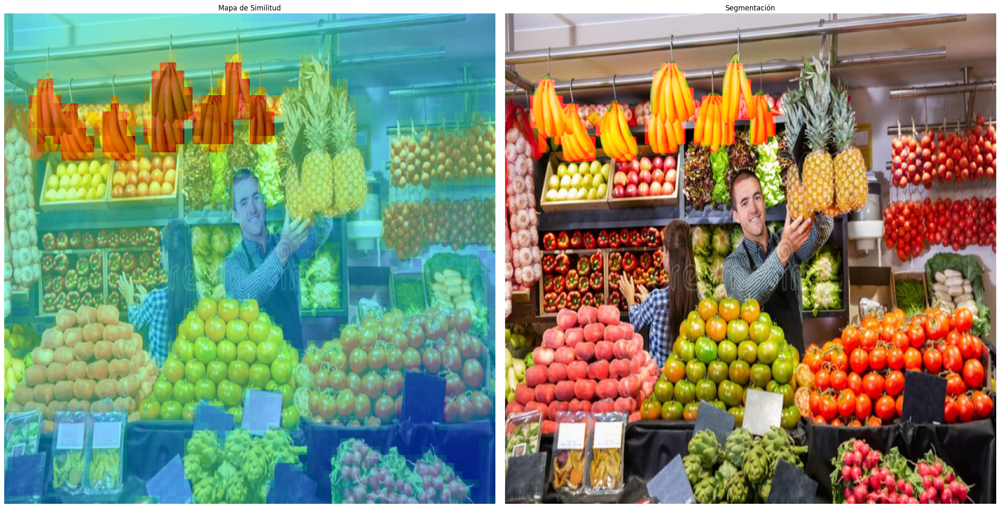

In [52]:
sims = compute_similarity(patch_of_interest.unsqueeze(0).unsqueeze(0), image_features.permute(1, 2, 0))
heat_image = jet_plot(frame, sims.squeeze(0).squeeze(0))
mask = (sims.squeeze(0).squeeze(0) > threshold).float().numpy()
segmented_frame = get_seg(frame, mask, color=color)

fig, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].imshow(heat_image.resize((IMAGE_SIZE, IMAGE_SIZE)))
axes[0].set_axis_off()
axes[0].set_title('Mapa de Similitud')
axes[1].imshow(Image.fromarray(segmented_frame).resize((IMAGE_SIZE, IMAGE_SIZE)))
axes[1].set_axis_off()
axes[1].set_title('Segmentación')
fig.tight_layout()

## Procesamiento de múltiples frames y preparación de datos para entrenamiento
Cargamos varios frames, extraemos parches positivos y negativos, y entrenamos un regresor lineal simple.

3 frames cargados


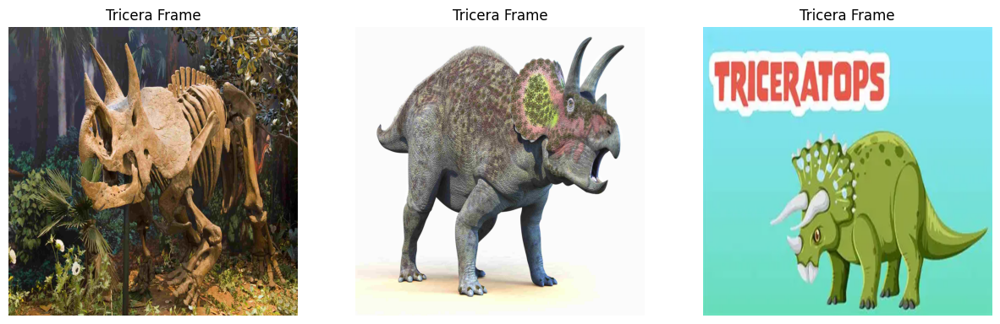

In [53]:
# Cargar frames de la carpeta tricera/
tricera_frames = glob('tricera/t*.*')
tricera_frames.sort()
tricera_frames = [Image.open(f).convert('RGB').resize((IMAGE_SIZE, IMAGE_SIZE)) for f in tricera_frames]
print(f'{len(tricera_frames)} frames cargados')
plt.figure(figsize=(15, 5))
for i, frame in enumerate(tricera_frames):
    plt.subplot(1, 3, i + 1)
    plt.imshow(frame)
    plt.axis("off")
    plt.title("Tricera Frame")

(np.float64(-0.5), np.float64(959.5), np.float64(959.5), np.float64(-0.5))

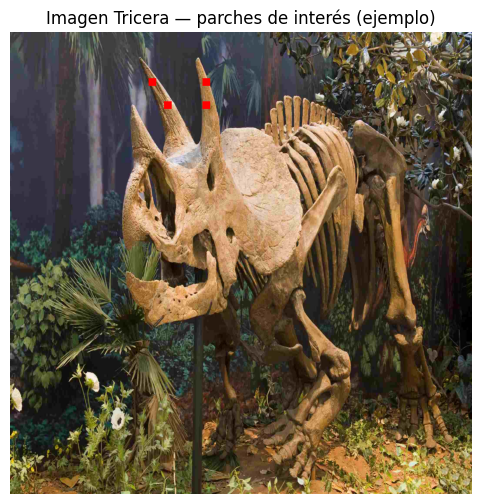

In [72]:
# Elegir parches de interés en el primer frame (ejemplo: cuernos)
frame = tricera_frames[0]
image_features = extract_dense_features(frame)

if False:
    # Boca
    x, y = [250, 260], [400, 540]
    m_x, m_y = None, None
    threshold = 0.6
else:
    # Cuernos
    x, y = [300, 400, 330, 400], [100, 150, 150, 100]  # cuernos
    m_x, m_y = None, None
    threshold = 0.65
patch_size = PATCH_SIZE
x, y = [int(xi / patch_size) for xi in x], [int(yi / patch_size) for yi in y]

image_with_patch = np.array(frame.copy())
patches_of_interest = []
all_patches_of_interest = []
all_patches = []
for _x, _y in zip(x, y):
    start_x = _x * patch_size
    start_y = _y * patch_size
    image_with_patch[start_y : start_y + patch_size, start_x : start_x + patch_size, :] = np.array([255, 0, 0], dtype=np.uint8)
    patches_of_interest.append(image_features[:, _y, _x])

patch_of_interest = torch.mean(torch.stack(patches_of_interest, dim=0), dim=0)
patch_of_interest = F.normalize(patch_of_interest, p=2, dim=0)

plt.figure(figsize=(8, 6))
plt.imshow(image_with_patch)
plt.title('Imagen Tricera — parches de interés (ejemplo)')
plt.axis('off')

/tmp/ipykernel_3521316/1928049528.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("jet")


Parches positivos acumulados: 96
Parches negativos acumulados: 7104


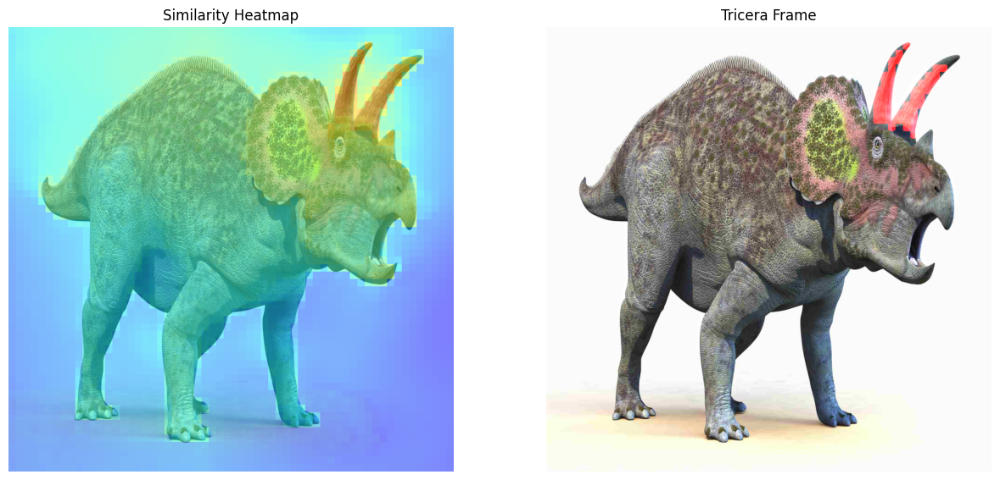

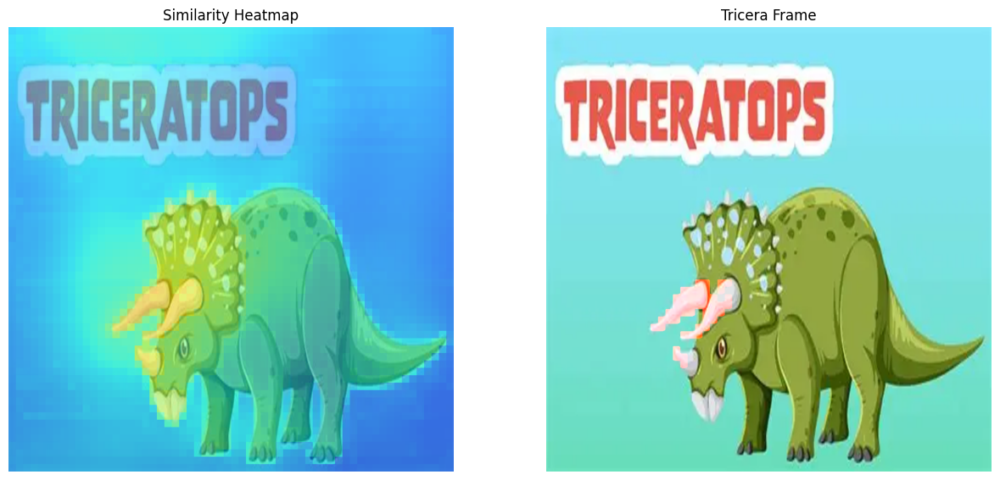

In [73]:
# Recolectar parches positivos y negativos a partir de otros frames
for i in [1, 2]:
    frame = tricera_frames[i]
    image_features = extract_dense_features(frame)
    sims = compute_similarity(patch_of_interest.unsqueeze(0).unsqueeze(0), image_features.permute(1, 2, 0))
    mask = (sims.squeeze(0).squeeze(0) > threshold).float().numpy()
    heat_image = jet_plot(frame, sims.squeeze(0).squeeze(0))
    segmented_frame = get_seg(frame, mask)
    for patch in image_features.flatten(1, 2).permute(1, 0)[mask.flatten().astype(np.bool)]:
        all_patches_of_interest.append(patch)
    for patch in image_features.flatten(1, 2).permute(1, 0)[~mask.flatten().astype(np.bool)]:
        all_patches.append(patch)
    plt.figure(figsize=(15, 15))
    plt.subplot(2, 2, 1)
    plt.imshow(heat_image)
    plt.axis("off")
    plt.title("Similarity Heatmap")
    plt.subplot(2, 2, 2)
    plt.imshow(segmented_frame)
    plt.axis("off")
    plt.title("Tricera Frame")

print(f'Parches positivos acumulados: {len(all_patches_of_interest)}')
print(f'Parches negativos acumulados: {len(all_patches)}')

In [75]:
# Preparar tensores y muestrear negativos
all_patches_of_interest_tensor = torch.stack(all_patches_of_interest, dim=0)
all_patches_tensor = torch.stack(all_patches, dim=0)

all_patches_sample = all_patches_tensor[torch.randperm(all_patches_tensor.shape[0])[: all_patches_of_interest_tensor.shape[0] * 4]]

from torch import nn
regressor = nn.Linear(all_patches_sample.shape[1], 2).cuda()
optimizer = torch.optim.AdamW(regressor.parameters(), lr=1e-3)
loss_fn = nn.CrossEntropyLoss()

x = torch.concat([all_patches_of_interest_tensor, all_patches_sample], dim=0)
y = torch.cat([torch.ones(all_patches_of_interest_tensor.shape[0]), torch.zeros(all_patches_sample.shape[0])], dim=0).long()

dataset = torch.utils.data.TensorDataset(x, y)
data_loader = torch.utils.data.DataLoader(dataset, batch_size=256, shuffle=True)

print('Datos preparados para entrenamiento del regresor lineal')

Datos preparados para entrenamiento del regresor lineal


![Local Image](./linear.png)

In [76]:
# Entrenamiento rápido del regresor (puede tardar dependiendo de la GPU)
for epoch in tqdm(range(500)):
    for _x, _y in data_loader:
        optimizer.zero_grad()
        outputs = regressor(_x.cuda())
        loss = loss_fn(outputs, _y.cuda())
        loss.backward()
        optimizer.step()
    if epoch % 50 == 0:
        print(f'Epoca {epoch}, Loss: {loss.item():.4f}')

  7%|▋         | 35/500 [00:00<00:02, 185.95it/s]

Epoca 0, Loss: 0.7030
Epoca 50, Loss: 0.3236


 31%|███       | 156/500 [00:00<00:00, 356.84it/s]

Epoca 100, Loss: 0.1933
Epoca 150, Loss: 0.1345


 49%|████▉     | 244/500 [00:00<00:00, 397.86it/s]

Epoca 200, Loss: 0.1004
Epoca 250, Loss: 0.0695


 76%|███████▌  | 379/500 [00:01<00:00, 429.00it/s]

Epoca 300, Loss: 0.0545
Epoca 350, Loss: 0.0477


 94%|█████████▍| 471/500 [00:01<00:00, 442.43it/s]

Epoca 400, Loss: 0.0421
Epoca 450, Loss: 0.0320


100%|██████████| 500/500 [00:01<00:00, 383.10it/s]


## Evaluación del regresor y visualización final
Aplicamos el regresor a diferentes frames para obtener una segmentación basada en la probabilidad de pertenecer a la clase positiva.

/tmp/ipykernel_3521316/1928049528.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("jet")


Text(0.5, 1.0, 'Segmentación (regresor)')

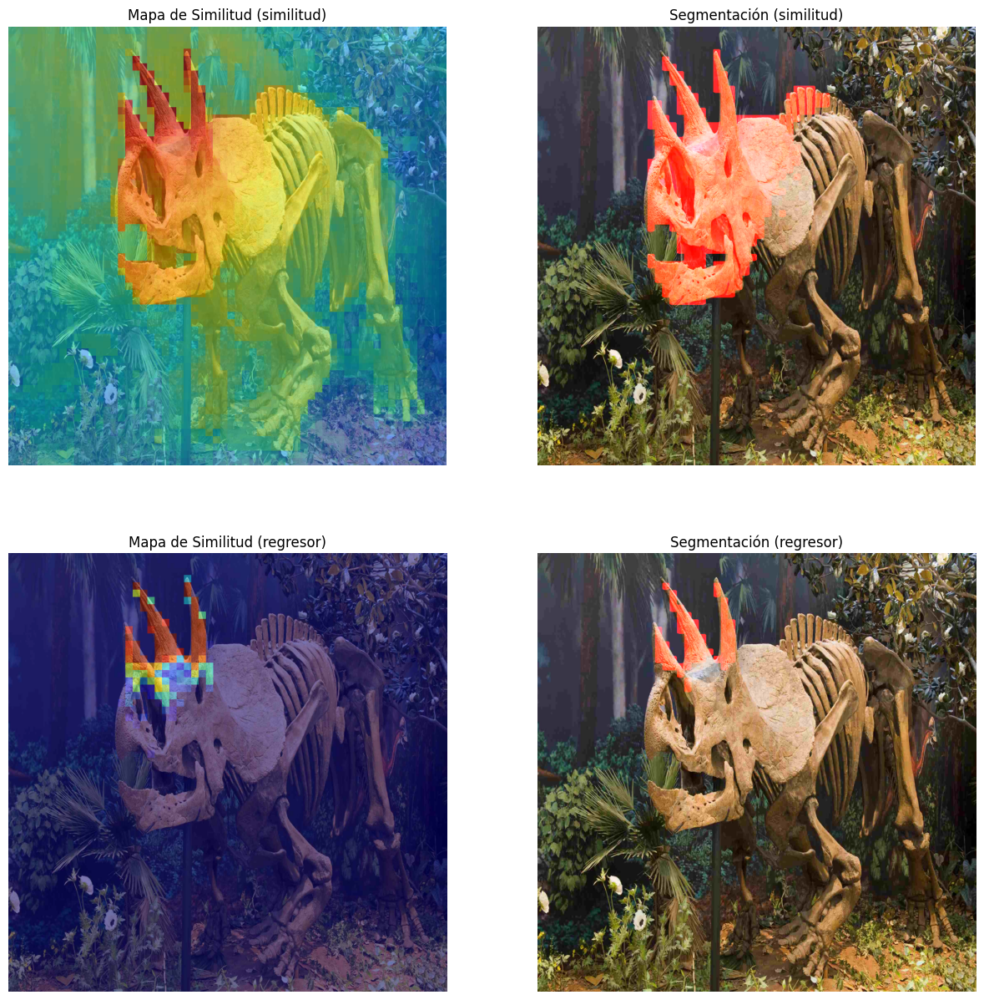

In [77]:
frame = tricera_frames[0]
image_features = extract_dense_features(frame)
image_features = F.normalize(image_features, p=2, dim=0)

sims = compute_similarity(
    patch_of_interest.unsqueeze(0).unsqueeze(0), image_features.permute(1, 2, 0)
)
heat_image = jet_plot(frame, sims.squeeze(0).squeeze(0))
mask = (sims.squeeze(0).squeeze(0) > threshold).float().numpy()
segmented_frame = get_seg(frame, mask)

plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1)
plt.imshow(heat_image)
plt.axis("off")
plt.title('Mapa de Similitud (similitud)')
plt.subplot(2, 2, 2)
plt.imshow(segmented_frame)
plt.axis("off")
plt.title('Segmentación (similitud)')
image_features = image_features.cuda()
sims = regressor(image_features.flatten(1, 2).T)
sims = sims.cpu().detach()
if False:
    sims = torch.argmax(sims, dim=1)
else:
    #sims = sims[:, 1] > 0.9
    sims = sims[:,1]
sims = sims.reshape(image_features.shape[1], image_features.shape[2])
heat_image = jet_plot(frame, sims.squeeze(0).squeeze(0))
mask = (sims.squeeze(0).squeeze(0) > threshold).float().numpy()
segmented_frame = get_seg(frame, mask)
plt.subplot(2, 2, 3)
plt.imshow(heat_image)
plt.axis("off")
plt.title('Mapa de Similitud (regresor)')
plt.subplot(2, 2, 4)
plt.imshow(segmented_frame)
plt.axis("off")
plt.title('Segmentación (regresor)')

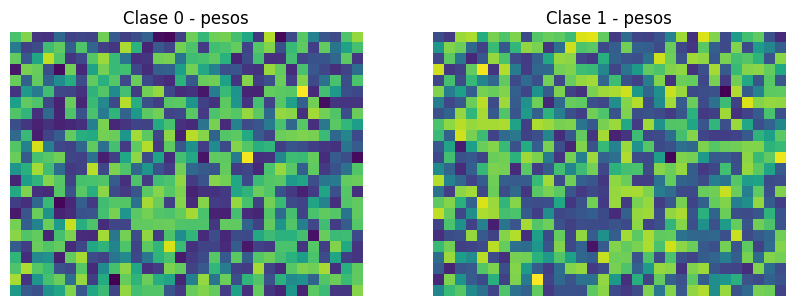

In [92]:
# Visualizar pesos del regresor (breve inspección)
weights = regressor.weight.data.cpu().numpy()
plt.figure(figsize=(10, 4))
for i in range(weights.shape[0]):
    plt.subplot(1, weights.shape[0], i + 1)
    plt.imshow(weights[i].reshape(24, 32))
    plt.axis('off')
    plt.title(f'Clase {i} - pesos')

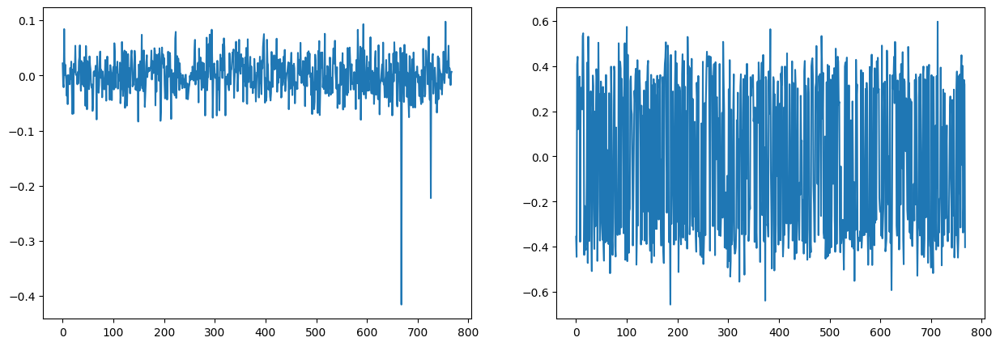

In [ ]:
# %%
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(patch_of_interest.cpu().numpy())
plt.title('parche de interes')
plt.subplot(1, 2, 2)
plt.plot(weights[1])
plt.title('pesos red neurona 1')

In [113]:
weights[1] @ patch_of_interest.cpu().numpy(), weights[0] @ patch_of_interest.cpu().numpy()

(np.float32(1.8685417), np.float32(-1.8541892))

In [114]:
weights[1] @ all_patches_sample[0].cpu().numpy(), weights[0] @ all_patches_sample[0].cpu().numpy()

(np.float32(-1.8482203), np.float32(1.8167038))